In [1]:
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits as afits
from mw_plot import MWPlot
import healpy as hp
from pylab import cm
from astropy.coordinates import SkyCoord,Galactocentric,Galactic
import astropy.units as u
from sample import get_apogee, gen_keys_condition
from chemicaltag import DBSCAN_tagging
from astropy.stats import mad_std
from matplotlib.lines import Line2D
from matplotlib.colors import LogNorm
from tqdm import tqdm
import isodist
%matplotlib inline

## Read in APOGEE dataset

In [2]:
dr='16'
allStar=get_apogee(dr=dr)

/home/npricejones/anaconda3/lib/python3.7/site-packages/apogee-1.-py3.7.egg/apogee/tools/read.py:1421: UserWarning: Swapping in stellar parameters and abundances from Leung & Bovy (2019a)
  warnings.warn("Swapping in stellar parameters and abundances from Leung & Bovy (2019a)")

/home/npricejones/anaconda3/lib/python3.7/site-packages/apogee-1.-py3.7.egg/apogee/tools/read.py:1424: UserWarning: Adding distances from Leung & Bovy (2019b)
  warnings.warn("Adding distances from Leung & Bovy (2019b)")

/home/npricejones/anaconda3/lib/python3.7/site-packages/apogee-1.-py3.7.egg/apogee/tools/read.py:1427: UserWarning: Adding ages from Mackereth, Bovy, Leung, et al. (2019)
  warnings.warn("Adding ages from Mackereth, Bovy, Leung, et al. (2019)")

/home/npricejones/anaconda3/lib/python3.7/site-packages/apogee-1.-py3.7.egg/apogee/tools/read.py:1430: UserWarning: Adding orbits and Galactocentric coordinates from DR16 astroNN VAC, calculated using galpy (Bovy 2015) and the staeckel approximation (M

## Prepare data for DBSCAN

In [3]:
elems = ['MG','AL','SI','K','TI','MN','FE','NI']
# Get good star indices
allStar,goodstars,elemkeys=gen_keys_condition(allStar,elems,dr=dr,uplim=0.15)
cutallStar = allStar[goodstars]
dbrun = DBSCAN_tagging(elems, elemkeys, len(cutallStar))
abuns = dbrun.realdata(allStar,goodstars)

/mnt/c/Users/natal/chemical-tagging/apogeeCT/sample.py:73: RuntimeWarning: invalid value encountered in less
  & (allStar['LOGG']<guplim)

/mnt/c/Users/natal/chemical-tagging/apogeeCT/sample.py:73: RuntimeWarning: invalid value encountered in greater
  & (allStar['LOGG']<guplim)

/mnt/c/Users/natal/chemical-tagging/apogeeCT/sample.py:100: RuntimeWarning: invalid value encountered in less
  (allStar[f'{elem}_{suff}_ERR'] < uplim) & \

/mnt/c/Users/natal/chemical-tagging/apogeeCT/sample.py:101: RuntimeWarning: invalid value encountered in greater
  (allStar[f'{elem}_{suff}_ERR'] > downlim)



## Run DBSCAN for a variety of eps and Npts values

eight_elems_realdata - 345 stars in 20 clusters


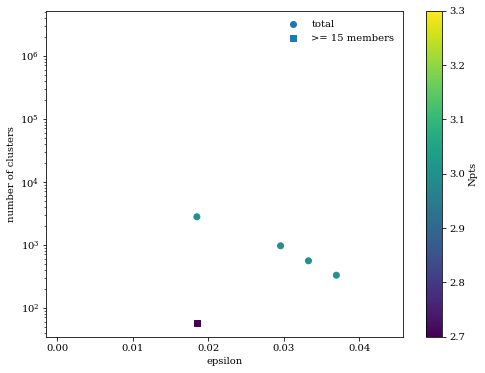

In [4]:
cwd = os.getcwd()+'/'
scalerange=[0.02,0.05,0.08,0.09,0.1]
dbrun.DBSCAN_scales(savename='eight_elems_realdata',workdir=cwd,
                    scalerange=scalerange,Nptsrange=[3])

In [5]:
import matplotlib.pyplot as plt
grey = '#666666'
fs=20
dark = False
pltsave=''
if dark:
    plt.style.use('dark_background')
    pltsave='_dark'
plt.rc('font', family='serif',size=fs)

def plothist2d(fig,ax,histdata,clabel=False,vmin=0,vmax=110,norm='lin',default_cmap='viridis'):
    """
    Create a 2D histogram of data represented by the two dimensions x and y
    
    fig:      Figure to plot in
    ax:       Subplot object to plot in
    histdata: containes information on how to plot the histogram
    clabel:   Label for the colourbar - no colourbar is plotted if this is not given
    vmin:     Minimum value of the histogram
    vmax:     Maximum value of the histogram
    
    """
    xedges,yedges,Hmasked = histdata
    # Plot histogram
    if norm == 'lin':
        im = ax.pcolormesh(xedges,yedges,Hmasked,
                           cmap = plt.get_cmap(default_cmap),
                           vmin=vmin,vmax=vmax,rasterized=True)
    elif norm == 'log':
        im = ax.pcolormesh(xedges,yedges,Hmasked,
                           cmap = plt.get_cmap(default_cmap),
                           norm=LogNorm(vmin=vmin,vmax=vmax),rasterized=True)
    # If colourbar is desired, plot and label it
    if clabel:
        cbar=fig.colorbar(im,pad = 0)
        cbar.set_label(label=clabel,fontsize=fs)
        cbar.ax.tick_params(labelsize=fs)
    return im
    
def histogram2d(x,y,bins=100):
    """
    Create a 2D histogram of data represented by the two dimensions x and y
    
    x:        Array of data values in 'x'
    y:        Array of data values in 'y'
    bins:     Number of bins in which to divide each axis
    
    """
    # Create histogram
    mask = (np.invert(np.isnan(x))) & (np.invert(np.isnan(y)))
    H,xedges,yedges = np.histogram2d(x[mask],y[mask],bins=bins)
    # Reorient appropriately
    H = np.rot90(H)
    H = np.flipud(H)
    # Mask where bins are empty
    Hmasked = np.ma.masked_where(H==0,H)
    return xedges,yedges,Hmasked

In [6]:
dr = '16'
all_elems = ['C','N','O','NA','MG','AL','SI','S','K','CA','TI','V','MN','FE','NI']
tag_elems = elems
suff='H'
propkeys=['C_{0}'.format(suff),
           'N_{0}'.format(suff),
           'O_{0}'.format(suff),
           'NA_{0}'.format(suff),
           'MG_{0}'.format(suff),
           'AL_{0}'.format(suff),
           'SI_{0}'.format(suff),
           'S_{0}'.format(suff),
           'K_{0}'.format(suff),
           'CA_{0}'.format(suff),
           'TI_{0}'.format(suff),
           'V_{0}'.format(suff),
           'MN_{0}'.format(suff),
           'FE_H',
           'NI_{0}'.format(suff)]
suff='FE'
abunkeys =['MG_{0}'.format(suff),
           'AL_{0}'.format(suff),
           'SI_{0}'.format(suff),
           'K_{0}'.format(suff),
           'TI_{0}'.format(suff),
           'MN_{0}'.format(suff),
           'FE_H',
           'NI_{0}'.format(suff)]

## Read in tagging information

In [7]:

realdata = h5py.File('{0}/eight_elems_realdata.hdf5'.format(cwd))
abundances = np.array(realdata['abundances'])
labels = np.array(realdata['labels'])
goodlabs = np.array(realdata['goodlabs'])
goodinds = np.array(realdata['goodinds'])
realdata.close()

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  """Entry point for launching an IPython kernel.



## Prepare background histograms

In [8]:
glatlon = histogram2d(allStar[goodstars]['GLON'],allStar[goodstars]['GLAT'],bins=100)
loggteff = histogram2d(allStar[goodstars]['TEFF'],allStar[goodstars]['LOGG'],bins=100)
reasonable = (np.invert(np.isnan(cutallStar['jr']))) & (np.invert(np.isnan(cutallStar['Lz']))) & (np.sqrt(cutallStar['jr'])>0) & (cutallStar['jr']<300) &(cutallStar['Lz']<4000) & (cutallStar['Lz']>500)
jrLz = histogram2d(cutallStar['Lz'][reasonable],cutallStar['jr'][reasonable],bins=100)

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until



## Get properties of three example groups

In [9]:
# Get cluster ages
medages = []
for l,lab in enumerate(np.unique(labels)[goodlabs]):
    match = labels==lab
    grpages = cutallStar['age_lowess_correct'][match][cutallStar['age_lowess_correct'][match]>0]
    medages.append(np.median(grpages))
medages=np.array(medages)

agesort = np.argsort(medages)
young = np.where(medages==np.min(medages))[0][0]
medium = np.where(medages==medages[agesort][int(len(medages)/2)])[0][0]
old = np.where(medages==np.max(medages))[0][0]
randints = [young, medium, old]
ages = medages[randints]
excolors=['C0','C2','C3']
exmarkers = ['^','s','p']

## Read OCCAM data

In [10]:
import astropy.io.fits as afits
#Get OCCAM data
cls = afits.open('data/occam_cluster-DR16.fits')
cls = cls[1].data
mem = afits.open('data/occam_member-DR16.fits')
mem = mem[1].data
apinds = np.array([],dtype=int)
clinds = np.array([],dtype=int)
for a,apoid in enumerate(mem['APOGEE_ID']):
    pb = 0.1
    if mem[a]['RV_PROB']>pb and mem[a]['PM_PROB']>pb and mem[a]['PM_PROB']<2 and mem[a]['FEH_PROB']>pb:
        occ = np.where(cls['NAME']=='_'.join(mem[a]['CLUSTER'].split(' ')))
        if cls['QUAL'][occ]>0:
            match = np.where(apoid==(cutallStar['APOGEE_ID']).astype('U100'))
            if len(match[0])>0:
                apinds = np.append(apinds,match[0][0])
                clinds = np.append(clinds,a)
clsallStar=cutallStar[apinds]
clsmems = mem[clinds]
clusters = np.unique(mem['CLUSTER'])

## Check if any OCCAM members found in groups

In [11]:
#Check if any occam groups found by DBSCAN
for o,oc, in enumerate(clusters):
    match = np.where(clsmems['CLUSTER']==oc)
    oclabels = labels[apinds][match]
    ocgoodlabs = [lab for lab in oclabels if lab in np.unique(labels)[goodlabs]]
    if ocgoodlabs != []:
        print(oc,ocgoodlabs)

## Get stellar coordinates in a variety of systems

In [12]:
from astropy.coordinates import SkyCoord,Galactocentric,Galactic
import astropy.units as u
coords = SkyCoord(ra=cutallStar['RA']*u.degree,
                  dec=cutallStar['DEC']*u.degree,
                  distance=cutallStar['weighted_dist']*u.pc,
                  pm_ra_cosdec=cutallStar['GAIA_PMRA']*(u.mas/u.yr),
                  pm_dec=cutallStar['GAIA_PMDEC']*(u.mas/u.yr),
                  radial_velocity=cutallStar['VHELIO_AVG']*(u.km/u.s))
coords = coords.transform_to(Galactocentric)
xpos = coords.x.to(u.kpc)
ypos = coords.y.to(u.kpc)
zpos = coords.z.to(u.kpc)
vx = coords.v_x.to(u.km/u.s)
vy = coords.v_y.to(u.km/u.s)
vz = coords.v_z.to(u.km/u.s)
coords = coords.transform_to(Galactic)
coords.representation_type='cartesian'
U = coords.U
V = coords.V
W = coords.W

/home/npricejones/anaconda3/lib/python3.7/site-packages/astropy/coordinates/builtin_frames/galactocentric.py:373: AstropyDeprecationWarning: In v4.1 and later versions, the Galactocentric frame will adopt default parameters that may update with time. An updated default parameter set is already available through the astropy.coordinates.galactocentric_frame_defaults ScienceState object, as described in but the default is currently still set to the pre-v4.0 parameter defaults. The safest way to guard against changing default parameters in the future is to either (1) specify all Galactocentric frame attributes explicitly when using the frame, or (2) set the galactocentric_frame_defaults parameter set name explicitly. See http://docs.astropy.org/en/latest/coordinates/galactocentric.html for more information.
  AstropyDeprecationWarning)

/home/npricejones/anaconda3/lib/python3.7/site-packages/astropy/coordinates/angles.py:522: RuntimeWarning: invalid value encountered in less
  if np.any(an

## Figure 2

findfont: Font family ['Verdana'] not found. Falling back to DejaVu Sans.


/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



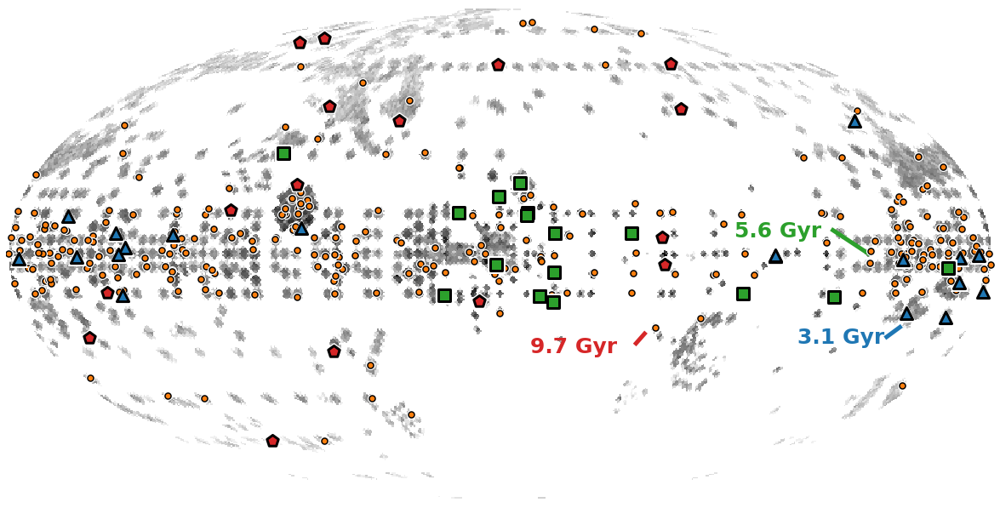

In [13]:
import healpy as hp
from pylab import cm
# Create background map
nsmap = 64
RCmap = np.zeros(hp.nside2npix(nsmap))
for i in range(cutallStar['GLON'].size):
    RCmap[hp.ang2pix(nsmap, float(cutallStar['GLON'][i]), float(cutallStar['GLAT'][i]), lonlat=1)] += 1
cmap = cm.Greys
fig = plt.figure(1,figsize=(20,9))
hp.mollview(RCmap, fig=1, title='', min=1, max=int(3e2),cmap=cmap,norm='log',
            cbar=0, badcolor='white', bgcolor='white')
randints = [young, medium, old]
zorder=2
for l,lab in enumerate(np.unique(labels)[goodlabs]):
    match = np.where(labels==lab)
    ordered = np.argsort(cutallStar['GLON'][match])
    hp.projscatter(cutallStar['GLON'][match],cutallStar['GLAT'][match],lonlat=1,c='w',s=100,zorder=zorder,marker='o',rasterized=True)
    hp.projscatter(cutallStar['GLON'][match],cutallStar['GLAT'][match],lonlat=1,c='C1',s=50,linewidth=1.5,zorder=zorder+1,marker='o',edgecolor='k',rasterized=True)
    zorder+=2
for l,rint in enumerate(randints):
    match = np.where(labels==np.unique(labels)[goodlabs][rint])
    ordered = np.argsort(cutallStar['GLON'][match])
    hp.projscatter(cutallStar['GLON'][match],cutallStar['GLAT'][match],lonlat=1,c='w',s=400,zorder=zorder,marker=exmarkers[l],rasterized=True)
    hp.projscatter(cutallStar['GLON'][match],cutallStar['GLAT'][match],lonlat=1,c=excolors[l],s=200,edgecolor='k',linewidth=3,zorder=zorder+1,marker=exmarkers[l],rasterized=True)
    zorder+=2
hp.projtext(-12,-30,'{0} Gyr'.format(np.round(medages[old],1)),lonlat=1,color=excolors[2],fontsize=25,weight='bold',fontname='Verdana')
hp.projplot([-53.5,-56],[-27,-24],lonlat=1,color=excolors[2],lw=5,zorder=1)
hp.projtext(-86,5,'{0} Gyr'.format(np.round(medages[medium],1)),lonlat=1,color=excolors[1],fontsize=25,weight='bold',fontname='Verdana')
hp.projplot([-122.5,-135],[7,0],lonlat=1,color=excolors[1],lw=5,zorder=1)
hp.projtext(-117,-27,'{0} Gyr'.format(np.round(medages[young],1)),lonlat=1,color=excolors[0],fontsize=25,weight='bold',fontname='Verdana')
hp.projplot([-150.5,-153.5],[-25,-22],lonlat=1,color=excolors[0],lw=5,zorder=1)
plt.tight_layout()
plt.savefig(f'figure2.pdf',rasterized=True)

## Figure 3

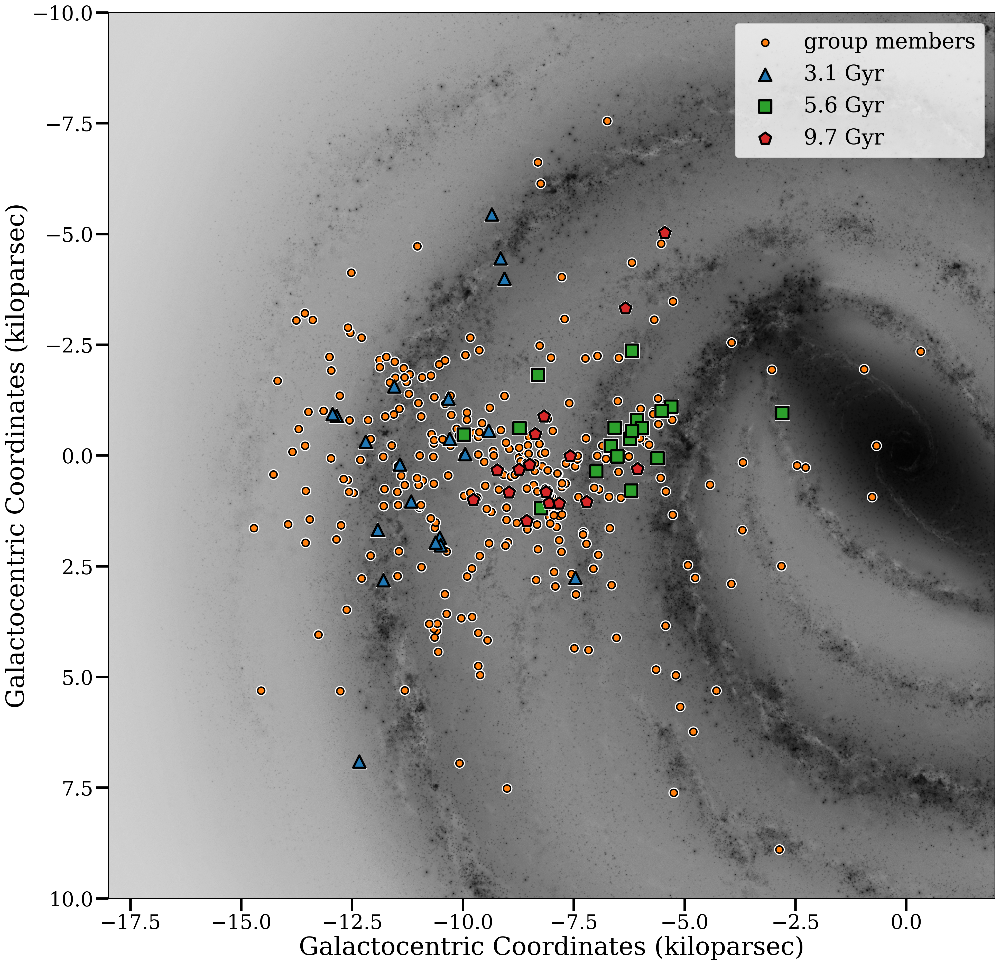

In [14]:
from mw_plot import MWPlot
plot_instance = MWPlot(mode='face-on', center=(-8, 0)*u.kpc, radius=10*u.kpc,
                       unit=u.kpc, coord='galactocentric', annotation=False, rot180=False,
                       grayscale=True)
zorder=1
lablist = np.unique(labels)[goodlabs]
for l,lab in enumerate(lablist):
    if l not in randints:
        match = np.where(labels==lab)
        xs = xpos[match]
        ys = ypos[match]
        plot_instance.s = 200
        plot_instance.zorder=zorder
        plot_instance.mw_scatter(xs, ys, c='w')
        plot_instance.s = 100
        plot_instance.zorder=zorder
        if lab==lablist[0]:
            plot_instance.mw_scatter(xs, ys, c='C1',edgecolor='k',lw=2,label='group members')
        else:
            plot_instance.mw_scatter(xs, ys, c='C1',edgecolor='k',lw=2)
        zorder+=2
    
for l,rint in enumerate(randints):
    match = np.where(labels==np.unique(labels)[goodlabs][rint])
    xs = xpos[match]
    ys = ypos[match]
    plot_instance.s = 450
    plot_instance.zorder=zorder
    plot_instance.mw_scatter(xs, ys, c='w', marker=exmarkers[l])
    plot_instance.s = 300
    plot_instance.zorder=zorder
    plot_instance.mw_scatter(xs, ys, c=excolors[l], marker=exmarkers[l], edgecolor='k',lw=3,label='{0:.1f} Gyr'.format(medages[rint]))
    zorder+=2
plt.legend(loc='best',fontsize=30)
plot_instance.savefig(f'topdown_mw{pltsave}.pdf')


## Table 1

In [15]:
from astropy.stats import mad_std
properties = np.zeros((len(np.unique(labels)[goodlabs]),19))
for l,lab in enumerate(np.unique(labels)[goodlabs]):
    match = np.where(labels==lab)
    properties[l][0] = lab
    properties[l][4] = len(match[0])
    properties[l][1] = np.median(cutallStar[match]['FE_H'])
    properties[l][2] = np.median(cutallStar[match]['C_FE'])
    properties[l][5] = np.median(cutallStar[match]['N_FE'])
    properties[l][6] = np.median(cutallStar[match]['O_FE'])
    properties[l][7] = np.median(cutallStar[match]['NA_FE'])
    properties[l][8] = np.median(cutallStar[match]['MG_FE'])
    properties[l][9] = np.median(cutallStar[match]['AL_FE'])
    properties[l][10] = np.median(cutallStar[match]['SI_FE'])
    properties[l][11] = np.median(cutallStar[match]['S_FE'])
    properties[l][12] = np.median(cutallStar[match]['K_FE'])
    properties[l][13] = np.median(cutallStar[match]['CA_FE'])
    properties[l][14] = np.median(cutallStar[match]['TI_FE'])
    properties[l][15] = np.median(cutallStar[match]['V_FE'])
    properties[l][16] = np.median(cutallStar[match]['MN_FE'])
    properties[l][17] = np.median(cutallStar[match]['NI_FE'])
    properties[l][3] = np.median(cutallStar[match]['age_lowess_correct'])
    properties[l][18] = mad_std(cutallStar[match]['age_lowess_correct'])
    #print(f'{lab}, {medfeh:.2f}, {medmgfe:.2f}, {medage:.1f}, {numstar}')
fesort = np.argsort(properties[:,1])
for p,prop in enumerate(properties[fesort]):
    if (p+1)%2 == 0:
        print('\t\t\\rowcolor{Gray}')
    print(f'\t\tPJ{p+1} & {prop[1]:.2f}  & {prop[8]:.2f} & {prop[9]:.2f} & {prop[10]:.2f}  & {prop[12]:.2f}  & {prop[15]:.2f} & {prop[16]:.2f} & {prop[17]:.2f} & {prop[3]:.1f} & {prop[18]:.1f} & {int(prop[4])}\\\\')


		PJ1 & -0.34  & 0.08 & 0.11 & 0.10  & 0.09  & -0.01 & -0.06 & 0.03 & 3.5 & 0.4 & 20\\
		\rowcolor{Gray}
		PJ2 & -0.32  & 0.03 & -0.06 & 0.05  & 0.00  & -0.10 & -0.08 & 0.03 & 4.7 & 0.4 & 16\\
		PJ3 & -0.31  & 0.04 & -0.05 & 0.06  & -0.00  & -0.10 & -0.09 & 0.02 & 4.6 & 0.6 & 16\\
		\rowcolor{Gray}
		PJ4 & -0.30  & 0.05 & 0.03 & 0.08  & -0.00  & -0.10 & -0.09 & 0.03 & 4.9 & 0.5 & 15\\
		PJ5 & -0.25  & 0.03 & -0.01 & 0.04  & 0.00  & -0.10 & -0.08 & 0.02 & 4.7 & 0.4 & 16\\
		\rowcolor{Gray}
		PJ6 & -0.21  & 0.03 & -0.07 & 0.04  & 0.01  & -0.07 & -0.07 & 0.01 & 4.6 & 0.3 & 19\\
		PJ7 & -0.11  & 0.00 & -0.08 & 0.02  & -0.02  & -0.03 & -0.06 & -0.01 & 4.3 & 0.6 & 17\\
		\rowcolor{Gray}
		PJ8 & -0.09  & 0.21 & 0.25 & 0.10  & 0.14  & 0.01 & -0.11 & 0.05 & 9.5 & 0.5 & 19\\
		PJ9 & -0.09  & 0.00 & -0.00 & 0.03  & -0.04  & -0.08 & -0.05 & -0.02 & 3.1 & 0.5 & 20\\
		\rowcolor{Gray}
		PJ10 & -0.08  & 0.03 & 0.03 & 0.01  & 0.00  & -0.01 & -0.05 & 0.02 & 4.2 & 0.9 & 16\\
		PJ11 & -0.07  & 0.22 & 0.2

## Check that all stars in a group are consistent with having the same age

In [16]:
ra = np.array(cutallStar['RA'])*u.degree
dec = np.array(cutallStar['DEC'])*u.degree
dis = np.array(cutallStar['weighted_dist'])*u.pc
pm_ra_cosdec = np.array(cutallStar['GAIA_PMRA'])*(u.mas/u.yr)
pm_dec = np.array(cutallStar['GAIA_PMDEC'])*(u.mas/u.yr)
rv = np.array(cutallStar['VHELIO_AVG'])*(u.km/u.s)
allages = np.array(cutallStar['age_lowess_correct'])*u.Gyr

for l,lab in enumerate(np.unique(labels)[goodlabs]):
    match = np.where(labels==lab)
    clsages = cutallStar['age_lowess_correct']
    medage = np.median(clsages)
    outmatch = np.where((clsages-medage)>0.3*medage)
    if len(outmatch[0]) > 0:
        print(f'{len(outmatch[0])} stars discrepant with median age for group {lab}')


/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]



## Figure 4

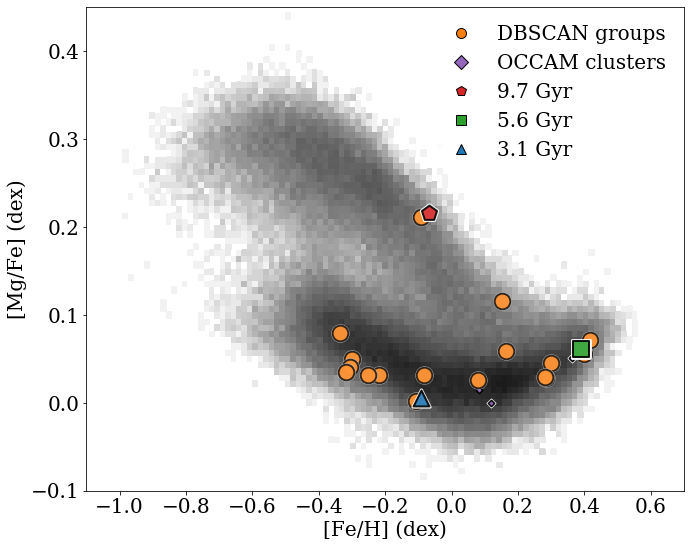

In [17]:
from matplotlib.lines import Line2D
from matplotlib.colors import LogNorm
legend_elements = [Line2D([0], [0], marker='o', color='w', label='DBSCAN groups',
                   markerfacecolor='C1', markersize=10, markeredgecolor='k'),
                   Line2D([0], [0], marker='D', color='w', label='OCCAM clusters',
                   markerfacecolor='C4', markersize=10,markeredgecolor='k')]

axlabels = {'MG_FE':'[Mg/Fe] (dex)',
            'FE_H':'[Fe/H] (dex)'}
key1='FE_H'
key2='MG_FE'
elem1='Fe'
elem2='Mg'
fig = plt.figure(figsize=(10,8))
ax = plt.subplot(111)
bhist = histogram2d(allStar[goodstars][key1],allStar[goodstars][key2],bins=100)
im = plothist2d(fig,ax,bhist,vmin=1,vmax=int(7e2),norm='log',default_cmap='Greys')
zorder=0
for c,cluster in enumerate(clusters):
    match = np.where(clsmems['CLUSTER']==cluster)
    xs = clsallStar[match][key1]
    ys = clsallStar[match][key2]
    if len(xs)>=15:
        avgxpos = np.mean(xs)
        avgypos = np.mean(ys)
        plt.scatter(avgxpos,avgypos,s=40,color='w',zorder=zorder,marker='D')
        plt.scatter(avgxpos,avgypos,s=20,color='C4',zorder=zorder+1,edgecolor='k',linewidth=1.5,marker='D')
        zorder+=2
for l,lab in enumerate(np.unique(labels)[goodlabs]):
    if l not in randints:
        match = np.where(labels==lab)
        matched = cutallStar[match]
        xs = matched[key1]
        ys = matched[key2]
        avgxpos = np.mean(xs)
        avgypos = np.mean(ys)
        plt.scatter(avgxpos,avgypos,s=300,color='w',zorder=zorder,alpha=0.8)
        plt.scatter(avgxpos,avgypos,s=250,color='C1',zorder=zorder+1,edgecolor='k',linewidth=2,alpha=0.8)
        zorder+=2
for r,rint in enumerate(randints[::-1]):
    lab = np.unique(labels)[goodlabs][rint]
    match = np.where(labels==lab)
    matched = cutallStar[match]
    xs = matched[key1]
    ys = matched[key2]
    avgxpos = np.mean(xs)
    avgypos = np.mean(ys)
    ax.scatter(avgxpos,avgypos,c='w',marker=exmarkers[::-1][r],lw=3,s=300,zorder=zorder,alpha=0.9)
    ax.scatter(avgxpos,avgypos,c=excolors[::-1][r],marker=exmarkers[::-1][r],edgecolor='k',lw=2,s=250,zorder=zorder+1,alpha=0.9)
    legend_elements.append(Line2D([0],[0],color='w',markerfacecolor=excolors[::-1][r],marker=exmarkers[::-1][r],markeredgecolor='k',markersize=10,label=f'{ages[::-1][r]:.1f} Gyr'))
plt.ylabel(axlabels[key2])
plt.xlabel(axlabels[key1])
legend=plt.legend(handles=legend_elements,loc='best',fontsize=20)
legend.get_frame().set_linewidth(0.0)
plt.xlim(-1.1,0.7)
plt.ylim(-0.1,0.45)
plt.tight_layout()
plt.savefig('{0}/figure4.pdf'.format(cwd),rasterized=True)

## Get OCCAM cluster spread properties

In [18]:
indepslist, nodup_inds = np.unique(clsmems['APOGEE_ID'],return_index=True)
nodupclsmems = clsmems[nodup_inds]
occutallStar = cutallStar[np.in1d(cutallStar['APOGEE_ID'],nodupclsmems['APOGEE_ID'])]
cutclsmems = nodupclsmems[np.in1d(nodupclsmems['APOGEE_ID'],occutallStar['APOGEE_ID'])]
oclabs = np.zeros(cutclsmems.shape,dtype=int)
for c,cluster in enumerate(clusters):
    match = np.where(cutclsmems['CLUSTER']==cluster)
    oclabs[match] = c
from sklearn.metrics import silhouette_samples
ocabuns = np.zeros((len(occutallStar),len(abunkeys)))
for k,key in enumerate(abunkeys):
    ocabuns[:,k] = occutallStar[key]
ocsils = silhouette_samples(ocabuns,cutclsmems['CLUSTER'])
ocsils = np.array([np.mean(ocsils[cutclsmems['CLUSTER']==cluster]) for cluster in clusters])
ocssigs = []
bigocs = []
for c,cluster in enumerate(clusters):
    match = np.where(cutclsmems['CLUSTER']==cluster)
    allstarmatch = np.in1d(occutallStar['APOGEE_ID'],cutclsmems[match]['APOGEE_ID'])
    if np.sum(allstarmatch)>=3:
        ocsig = np.array([])
        bigocs.append(cluster)
        for key in propkeys:
            elem = key.split('_')[0]
            if elem != 'FE':
                key = '{0}_FE'.format(elem)
            ocsig = np.append(ocsig,mad_std(occutallStar[allstarmatch][key][np.invert(np.isnan(occutallStar[allstarmatch][key]))]))
        ocssigs.append(ocsig)
ocssigs = np.array(ocssigs)


/home/npricejones/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/npricejones/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



## Figure 5

0it [00:00, ?it/s]

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in less



9it [00:02,  3.83it/s]

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in less



12it [00:03,  2.81it/s]

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in less



20it [00:06,  3.17it/s]


/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in greater

/home/npricejones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in less



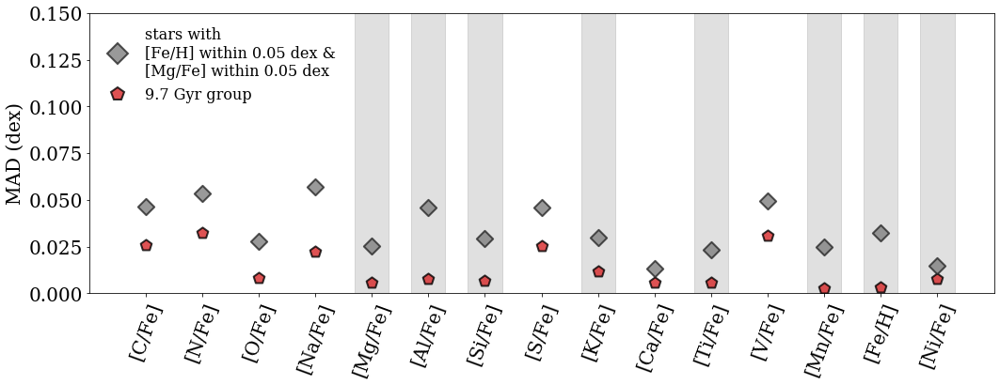

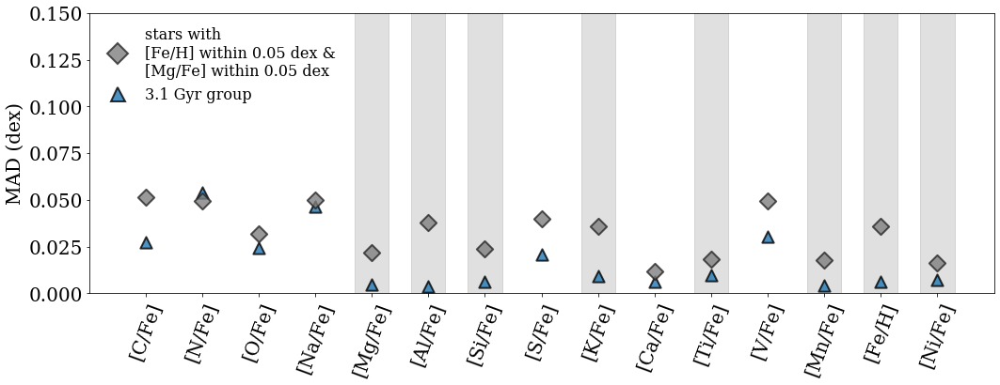

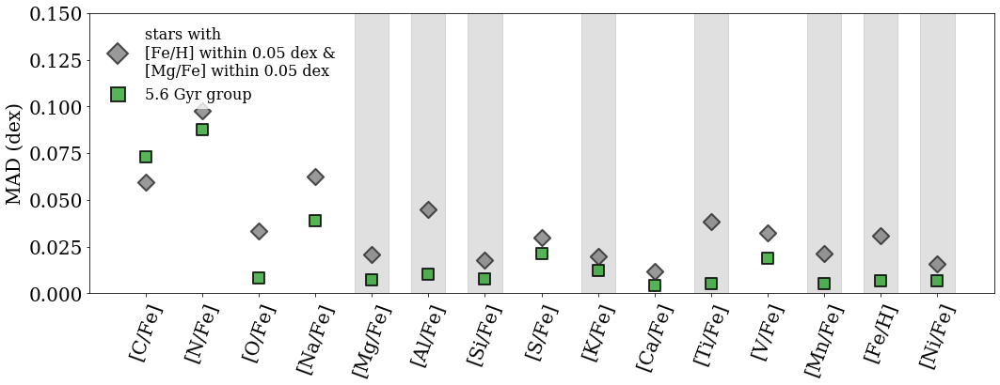

In [19]:
from tqdm import tqdm
ages = []
cmgs = []
amgs = []
cfes = []
afes = []
clssigs = []
allsigs = []
uncerts = []
labs = np.unique(labels)[goodlabs]
agemis = []
sublabels={
    randints[0]:'a',
    randints[1]:'b',
    randints[2]:'c'
    
}
for l,lab in tqdm(enumerate(labs)):
    match = np.where(labels==lab)
    clusstars = cutallStar[match]
    numstars = len(clusstars)
    unmatch = labels!=lab
    clsstds = np.array([])
    mgfestds = np.array([])
    uncert = np.array([])
    # iron match
    clusterfes = clusstars['FE_H']
    femin = np.mean(clusterfes)-0.05
    femax = np.mean(clusterfes)+0.05
    fematch = (cutallStar['FE_H']>femin) & (cutallStar['FE_H']<femax) & unmatch
    # magnesium match
    clustermgs = clusstars['MG_FE']
    mgmin = np.mean(clustermgs)-0.05
    mgmax = np.mean(clustermgs)+0.05
    mgmatch = (cutallStar['MG_FE']>mgmin) & (cutallStar['MG_FE']<mgmax) & unmatch
    # age match - presently unused
    clusterages = clusstars['age_lowess_correct'][clusstars['age_lowess_correct']>=0]
    agemin = np.median(clusterages)-2
    agemax = np.median(clusterages)+2
    agemis.append(np.sum((clusterages < agemin) | (clusterages > agemax))/len(clusterages)) 
    agematch = (cutallStar['age_lowess_correct']>agemin) & (cutallStar['age_lowess_correct']<agemax) & unmatch
    ages.append(np.median(clusterages))
    cfes.append(mad_std(clusterfes))
    afes.append(mad_std(cutallStar[fematch&mgmatch&agematch]['FE_H']))
    cmgs.append(mad_std(clustermgs))
    amgs.append(mad_std(cutallStar[fematch&mgmatch&agematch]['MG_FE']))
    fig=plt.figure(figsize=(15,6)) 
    ax = plt.subplot(111)
    xlabels = []
    for k,key in enumerate(propkeys):
        elem = key.split('_')[0]
        if elem != 'FE':
            key = '{0}_FE'.format(elem)
            xlabels.append('[{0}/Fe]'.format(elem.capitalize()))
        elif elem=='FE':
            xlabels.append('[Fe/H]')
        if elem in tag_elems:
            ax.fill_between([k-0.3,k+0.3],-5,5,color=grey,alpha=0.2) 
        elemgoodallStar = cutallStar[key]
        grpmad = mad_std(elemgoodallStar[match])
        allmad = mad_std(elemgoodallStar[mgmatch&fematch])
        clsstds=np.append(clsstds,grpmad)
        mgfestds=np.append(mgfestds,allmad)
        uncert=np.append(uncert,np.median(cutallStar['{0}_ERR'.format(key)][match]))
        if l==old:
            co='C3'
            ma='p'
        elif l==medium:
            co='C2'
            ma='s'
        elif l==young:
            co='C0'
            ma='^'
        else:
            co='C1'
            ma='o'
        ax.scatter(k,grpmad,color=co,s=150,alpha=0.8,edgecolor='k',linewidth=2,marker=ma)
        ax.scatter(k,allmad,color='grey',s=150,alpha=0.8,edgecolor='#262626',linewidth=2,marker='D')
        
    ax.set_xticks(np.arange(len(xlabels)))
    ax.set_xticklabels(xlabels,rotation=70)
    ax.set_xlim(-1,len(xlabels))
    axlims = np.concatenate((clsstds,mgfestds))
    ax.set_ylim(0,0.15)
    ax.set_ylabel('MAD (dex)')
    leglabel = 'members of\nDBSCAN group'
    if l == old:
        leglabel='{0} Gyr group'.format(np.round(medages[old],1))
    elif l == medium:
        leglabel='{0} Gyr group'.format(np.round(medages[medium],1))
    elif l == young:
        leglabel='{0} Gyr group'.format(np.round(medages[young],1))

    legend_elements = [Line2D([0], [0], marker='D', color='w', 
                              label='stars with\n[Fe/H] within 0.05 dex &\n[Mg/Fe] within 0.05 dex',
                              markerfacecolor='grey', markersize=15, alpha=0.8, markeredgecolor='#262626',
                              markeredgewidth=2),
                       Line2D([0], [0], marker=ma, color='w', label=leglabel,
                              markerfacecolor=co, markersize=15,alpha=0.8, markeredgecolor='k',
                              markeredgewidth=2)]
    legend=ax.legend(handles=legend_elements,loc='upper left',fontsize=16)
    legend.get_frame().set_linewidth(0.0)
    plt.tight_layout()
    if l in randints:
        plt.savefig(f'figure5{sublabels[l]}.pdf')
    elif l not in randints:
        plt.close()
    clssigs.append(clsstds)
    allsigs.append(mgfestds)
    uncerts.append(uncert)
    
clssigs = np.array(clssigs)
allsigs = np.array(allsigs)
uncerts = np.array(uncerts)

## Figure 6

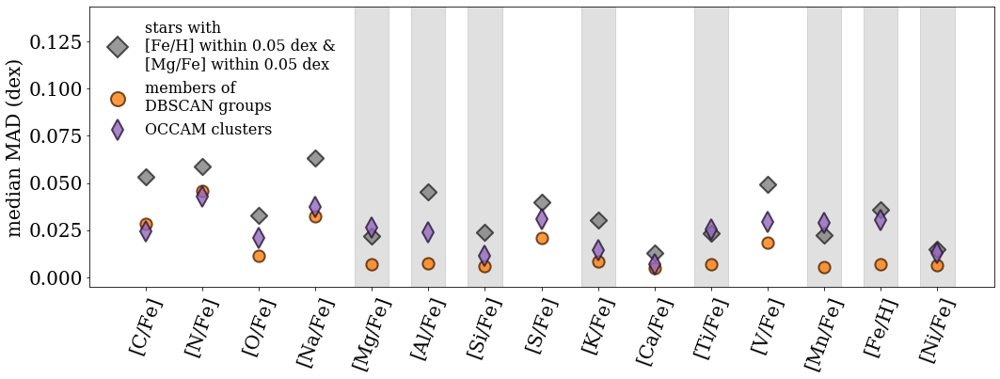

In [20]:
plt.figure(figsize=(15,6))
ax = plt.subplot(111)
for k,key in enumerate(propkeys):
    elem = key.split('_')[0]
    if elem in tag_elems:
        ax.fill_between([k-0.3,k+0.3],-5,5,color=grey,alpha=0.2)
medvals = np.median(clssigs,axis=0)
medocs = np.nanmedian(ocssigs,axis=0)
medalls = np.median(allsigs,axis=0)
meduns = np.median(uncerts,axis=0)
ax.scatter(np.arange(len(propkeys)),medalls,marker='D',s=150,c='grey',alpha=0.8,edgecolor='#262626',linewidth=2)
ax.scatter(np.arange(len(propkeys)),medvals,marker='o',s=150,c='C1',alpha=0.8,edgecolor='#4d2400',linewidth=2)
ax.plot(medocs,'d',ms=15,color='C4',alpha=0.8,label='OCCAM clusters',markeredgecolor='#271735',markeredgewidth=2)
axlims = np.concatenate((medvals,medalls))
ax.set_xticks(np.arange(len(xlabels)))
ax.set_xticklabels(xlabels,rotation=70)
ax.set_xlim(-1,len(xlabels))
ax.set_ylim(np.min(axlims)-0.01,np.max(axlims)+0.08)
ax.set_ylabel('median MAD (dex)')
legend_elements = [Line2D([0], [0], marker='D', color='w', 
                          label='stars with\n[Fe/H] within 0.05 dex &\n[Mg/Fe] within 0.05 dex',
                          markerfacecolor='grey', markersize=15, alpha=0.8, markeredgecolor='#262626',
                          markeredgewidth=2),
                   Line2D([0], [0], marker='o', color='w', label='members of\nDBSCAN groups',
                          markerfacecolor='C1', markersize=15,alpha=0.8, markeredgecolor='#4d2400',
                          markeredgewidth=2),
                   Line2D([0], [0], marker='d', color='w', label='OCCAM clusters',
                          markerfacecolor='C4', markersize=15,alpha=0.8, markeredgecolor='#271735',
                          markeredgewidth=2),]
legend=ax.legend(handles=legend_elements,loc='upper left',fontsize=16)
legend.get_frame().set_linewidth(0.0)
plt.tight_layout()
plt.savefig(f'figure6.pdf')

## Figure 7

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/c/Users/natal/chemical-tagging/isodist/parsec-2mass-spitzer-wise/parsec-2mass-spitzer-wise-Z-0.0120.dat.gz'

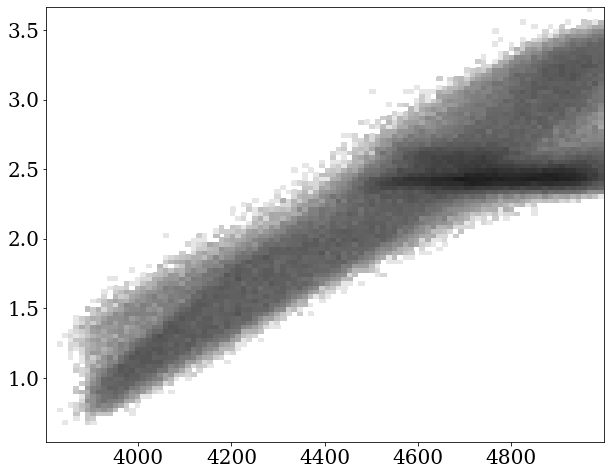

In [21]:
import isodist
lab = np.unique(labels)[goodlabs][young]
match = np.where(labels==lab)

fig=plt.figure(figsize=(10,8))
ax = plt.subplot(111)
im = plothist2d(fig,ax,loggteff,vmin=1,vmax=int(1e3),norm='log',default_cmap='gray_r')
avgfeh = np.median(cutallStar[match]['FE_H'])
medage = np.median(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
Z= int(int(1./0.0005)*(10**avgfeh*0.015))*0.0005
p = isodist.PadovaIsochrone(parsec=True,Z=Z)
print(cutallStar[match]['FE_H'])
print(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
uppermass = [1.59,1.285,1.1405,1.0508,0.9868,0.9835,0.9375]
agelist = np.array([2.0,4.0,6.0,8.0,10.0,medage,12.0])
colors = plt.get_cmap('Greys')(np.linspace(0,1,len(agelist)+1))
for a,age in enumerate(agelist):
    #iso = mist.isochrone(np.log10(age*1e9),avgfeh)
    #masscut = (iso['initial_mass']<uppermass[a])
    #masscut = np.ones(len(iso['Teff'])).astype(bool)
    logage= (int(int(1./0.05)*(9.+np.log10(age)))*0.05)
    print("Using [Fe/H] = {feh:.3f}, age = {age:.2f} Gyr".format(feh=np.log10(Z/0.015),age=10**(logage-9.)))
    tiso= p(logage,Z=Z)
    Teff = 10.**(tiso['logTe'])
    logg = tiso['logg']
    if age==medage:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color='#7cbce9',zorder=2,alpha=1.0,lw=4)
        ax.plot(Teff,logg,color='C0',zorder=2,alpha=1.0,lw=4)
    else:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color=colors[a+1],zorder=1,alpha=1,lw=2)
        ax.plot(Teff,logg,color=colors[a+1],zorder=1,alpha=1,lw=2)
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='w',zorder=3,s=200,marker='^')
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='C0',edgecolors='k',zorder=3,s=100,marker='^',linewidth=2)
plt.ylim(3.75,0.5)
plt.xlim(5000,3800)
#plt.text(4500,2.05,'median age {0} Gyr'.format(np.round(medage,2)),rotation=28,color='C1')
plt.text(4200,2.5,'age={0:.1f} Gyr\n[Fe/H]={1:.2f}'.format(medage,avgfeh),color='C0',weight='bold',fontname='Verdana')
#plt.plot([4200,4380],[2.3,2.1],lw=2,color='#7cbce9')
plt.xlabel('effective temperature (K)')
plt.ylabel('surface gravity')
norm = mpl.colors.Normalize(vmin=0,vmax=12)
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)
sm.set_array([])
#cbaxes = inset_axes(ax, width="3%", height="30%", loc=2)
ticks = np.linspace(2,12,len(agelist)-1)
#cbar = plt.colorbar(sm, cax=cbaxes, ticks=ticks, orientation='vertical',cmap='Greys')
#cbar.ax.set_yticklabels(['2 Gyr','4 Gyr','6 Gyr','8 Gyr','10 Gyr','12 Gyr'])

plt.tight_layout()
plt.savefig('isochrone{0}{1}.pdf'.format(lab,pltsave))

lab = np.unique(labels)[goodlabs][medium]
match = np.where(labels==lab)

fig=plt.figure(figsize=(10,8))
ax = plt.subplot(111)
im = plothist2d(fig,ax,loggteff,vmin=1,vmax=int(1e3),norm='log',default_cmap='gray_r')
avgfeh = np.median(cutallStar[match]['FE_H'])
medage = np.median(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
Z= int(int(1./0.0005)*(10**avgfeh*0.015))*0.0005
p = isodist.PadovaIsochrone(parsec=True,Z=Z)
print(cutallStar[match]['FE_H'])
print(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
uppermass = [1.59,1.285,1.1405,1.0508,0.9868,0.9835,0.9375]
agelist = np.array([2.0,4.0,6.0,8.0,10.0,medage,12.0])
colors = plt.get_cmap('Greys')(np.linspace(0,1,len(agelist)+1))
for a,age in enumerate(agelist):
    # iso = mist.isochrone(np.log10(age*1e9),avgfeh)
    # masscut = (iso['initial_mass']<uppermass[a])
    # masscut = np.ones(len(iso['Teff'])).astype(bool)
    logage= (int(int(1./0.05)*(9.+np.log10(age)))*0.05)
    print("Using [Fe/H] = {feh:.3f}, age = {age:.2f} Gyr".format(feh=np.log10(Z/0.015),age=10**(logage-9.)))
    tiso= p(logage,Z=Z)
    Teff = 10.**(tiso['logTe'])
    logg = tiso['logg']
    if age==medage:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color='#7cbce9',zorder=2,alpha=1.0,lw=4)
        ax.plot(Teff,logg,color='C2',zorder=2,alpha=1.0,lw=4)
    else:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color=colors[a+1],zorder=1,alpha=1,lw=2)
        ax.plot(Teff,logg,color=colors[a+1],zorder=1,alpha=1,lw=2)
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='w',zorder=3,s=200,marker='s')
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='C2',edgecolors='k',zorder=3,s=100,marker='s',linewidth=2)
plt.ylim(3.75,0.5)
plt.xlim(5000,3800)
#plt.text(4500,2.05,'median age {0} Gyr'.format(np.round(medage,2)),rotation=28,color='C1')
plt.text(4200,2.5,'age={0:.1f} Gyr\n[Fe/H]={1:.2f}'.format(medage,avgfeh),color='C2',weight='bold',fontname='Verdana')
#plt.plot([4200,4380],[2.3,2.1],lw=2,color='#5fd35f')
plt.xlabel('effective temperature (K)')
plt.ylabel('surface gravity')
norm = mpl.colors.Normalize(vmin=0,vmax=12)
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)
sm.set_array([])
#cbaxes = inset_axes(ax, width="3%", height="30%", loc=2)
ticks = np.linspace(2,12,len(agelist)-1)
#cbar = plt.colorbar(sm, cax=cbaxes, ticks=ticks, orientation='vertical',cmap='Greys')
#cbar.ax.set_yticklabels(['2 Gyr','4 Gyr','6 Gyr','8 Gyr','10 Gyr','12 Gyr'])

plt.tight_layout()
plt.savefig('isochrone{0}{1}.pdf'.format(lab,pltsave))

lab = np.unique(labels)[goodlabs][old]
match = np.where(labels==lab)

fig=plt.figure(figsize=(10,8))
ax = plt.subplot(111)
im = plothist2d(fig,ax,loggteff,vmin=1,vmax=int(1e3),norm='log',default_cmap='gray_r')
avgfeh = np.median(cutallStar[match]['FE_H'])
medage = np.median(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
Z= int(int(1./0.0005)*(10**avgfeh*0.015))*0.0005
p = isodist.PadovaIsochrone(parsec=True,Z=Z)
print(cutallStar[match]['FE_H'])
print(cutallStar[match]['age_lowess_correct'][cutallStar[match]['age_lowess_correct']>=0])
uppermass = [1.59,1.285,1.1405,1.0508,0.9868,0.9835,0.9375]
agelist = np.array([2.0,4.0,6.0,8.0,10.0,medage,12.0])
colors = plt.get_cmap('Greys')(np.linspace(0,1,len(agelist)+1))
for a,age in enumerate(agelist):
    # iso = mist.isochrone(np.log10(age*1e9),avgfeh)
    # masscut = (iso['initial_mass']<uppermass[a])
    # masscut = np.ones(len(iso['Teff'])).astype(bool)
    logage= (int(int(1./0.05)*(9.+np.log10(age)))*0.05)
    print("Using [Fe/H] = {feh:.3f}, age = {age:.2f} Gyr".format(feh=np.log10(Z/0.015),age=10**(logage-9.)))
    tiso= p(logage,Z=Z)
    Teff = 10.**(tiso['logTe'])
    logg = tiso['logg']
    if age==medage:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color='#7cbce9',zorder=2,alpha=1.0,lw=4)
        ax.plot(Teff,logg,color='C3',zorder=2,alpha=1.0,lw=4)
    else:
    #    ax.plot(iso['Teff'][masscut],iso['logg'][masscut],color=colors[a+1],zorder=1,alpha=1,lw=2)
        ax.plot(Teff,logg,color=colors[a+1],zorder=1,alpha=1,lw=2)
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='w',zorder=3,s=200,marker='p')
plt.scatter(cutallStar[match]['TEFF'],cutallStar[match]['LOGG'],
            c='C3',edgecolors='k',zorder=3,s=100,marker='p',linewidth=2)
plt.ylim(3.75,0.5)
plt.xlim(5000,3800)
#plt.text(4500,2.05,'median age {0} Gyr'.format(np.round(medage,2)),rotation=28,color='C1')
plt.text(4200,2.5,'age={0:.1f} Gyr\n[Fe/H]={1:.2f}'.format(medage,avgfeh),color='C3',weight='bold',fontname='Verdana')
#plt.plot([4200,4380],[2.3,2.1],lw=2,color='#e77e7e')
plt.xlabel('effective temperature (K)')
plt.ylabel('surface gravity')
norm = mpl.colors.Normalize(vmin=0,vmax=12)
sm = plt.cm.ScalarMappable(cmap='Greys', norm=norm)
sm.set_array([])
cbaxes = inset_axes(ax, width="3%", height="30%", loc=2)
ticks = np.linspace(2,12,len(agelist)-1)
cbar = plt.colorbar(sm, cax=cbaxes, ticks=ticks, orientation='vertical',cmap='Greys')
cbar.ax.set_yticklabels(['2 Gyr','4 Gyr','6 Gyr','8 Gyr','10 Gyr','12 Gyr'])

plt.tight_layout()
plt.savefig('isochrone{0}{1}.pdf'.format(lab,pltsave))

## Figure 8

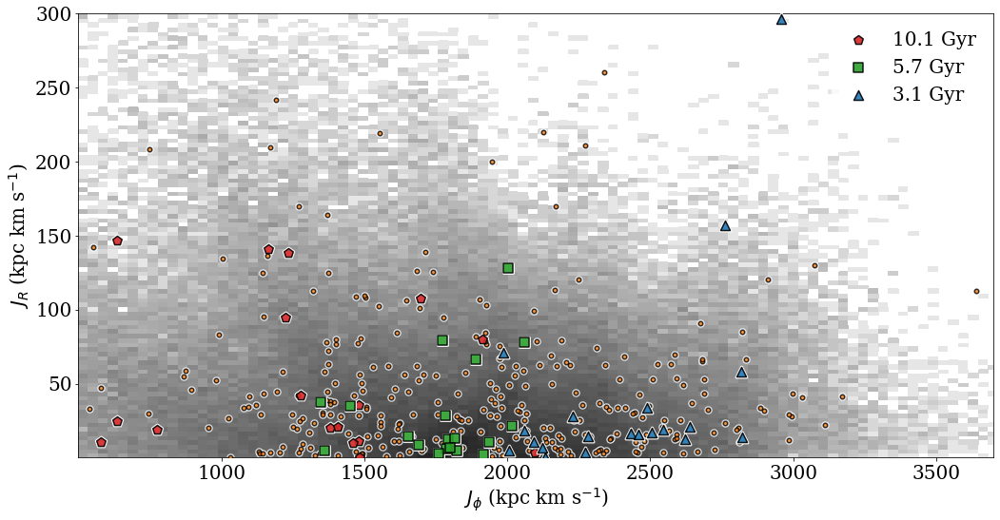

In [38]:
fig=plt.figure(figsize=(15,8))
ax = plt.subplot(111)
im = plothist2d(fig,ax,jrLz,vmin=1,vmax=int(1e3),norm='log',default_cmap='gray_r')
ax.set_xlim(np.min(cutallStar['Lz'][reasonable]),3700)
ax.set_ylim(np.min(cutallStar['jr'][reasonable]),300)
ax.set_xlabel(r'$J_{\phi}$ (kpc km s$^{-1}$)')
ax.set_ylabel(r'$J_R$ (kpc km s$^{-1}$)')
zorder=1
for l,lab in enumerate(np.unique(labels)[goodlabs]):
    match = np.where(labels==lab)
    if l not in randints:
        ax.scatter(cutallStar['Lz'][match],cutallStar['jr'][match],c='w',marker='o',lw=3,s=30,zorder=zorder+1,alpha=0.8)
        if lab == np.unique(labels)[goodlabs][-1]:
            ax.scatter(cutallStar['Lz'][match],cutallStar['jr'][match],c='C1',marker='o',edgecolor='k',lw=1.5,s=20,zorder=zorder+2,alpha=0.8,label='members of\nother groups')
        else:
            ax.scatter(cutallStar['Lz'][match],cutallStar['jr'][match],c='C1',marker='o',edgecolor='k',lw=1.5,s=20,zorder=zorder+2,alpha=0.8)
ages = medages[randints]
for r,rint in enumerate(randints[::-1]):
    lab = np.unique(labels)[goodlabs][rint]
    match = np.where(labels==lab)
    sort = np.argsort(cutallStar['Lz'][match])
    ax.scatter(cutallStar['Lz'][match],cutallStar['jr'][match],c='w',marker=exmarkers[::-1][r],lw=3,s=120,zorder=zorder+1,alpha=0.9)
    ax.scatter(cutallStar['Lz'][match],cutallStar['jr'][match],c=excolors[::-1][r],marker=exmarkers[::-1][r],edgecolor='k',lw=1.5,s=100,zorder=zorder+2,alpha=0.9,label=f'{ages[::-1][r]:.1f} Gyr')
    zorder+=3
legend=plt.legend(loc='best')
legend.get_frame().set_linewidth(0.0)
plt.tight_layout()
plt.savefig('figure8.pdf'.format(lab,pltsave),rasterized=True)